# MultiVelo Fig5

Data for this figure can be found at the links below:

RNA: https://figshare.com/account/projects/164299/articles/22575358

ATAC: https://figshare.com/account/projects/164299/articles/22575343

If you do not download them manually, the notebook will do so automatically.

In [1]:
import os
import scipy
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import sys
import multivelo as mv
import matplotlib.pyplot as plt
import requests
sys.path.append('../')
print(sys.path)

['/Users/jake/Desktop/Dev/MultiVelo/Examples', '/Users/jake/opt/anaconda3/lib/python39.zip', '/Users/jake/opt/anaconda3/lib/python3.9', '/Users/jake/opt/anaconda3/lib/python3.9/lib-dynload', '', '/Users/jake/.local/lib/python3.9/site-packages', '/Users/jake/opt/anaconda3/lib/python3.9/site-packages', '/Users/jake/Desktop/Dev/MultiVelo/src', '/Users/jake/opt/anaconda3/lib/python3.9/site-packages/aeosa', '/Users/jake/MWNN', '/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg', '/Users/jake/opt/anaconda3/lib/python3.9/site-packages/IPython/extensions', '/Users/jake/.ipython', '/Users/jake/Desktop/Dev/MultiVelo/src/multivelo/..', '/Users/jake/Desktop/Dev/MultiVelo/src/multivelo/..', '/Users/jake/Desktop/Dev/MultiVelo/src/multivelo', '/Users/jake/Desktop/Dev/MultiVelo/src/multivelo/..', '/Users/jake/Desktop/Dev/MultiVelo/src/multivelo/..', '../']


In [2]:
import time

mv.settings.LOG_FILENAME = "Fig5_" + str(time.time()) + ".txt"

In [3]:
scv.settings.verbosity = 3
scv.settings.presenter_view = True
scv.set_figure_params('scvelo')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 200)
np.set_printoptions(suppress=True)

In [4]:
rna_url = "https://figshare.com/ndownloader/files/40064320"
atac_url = "https://figshare.com/ndownloader/files/40064311"

rna_path = "3423_MV_2_adata_postpro.h5ad"
atac_path = "3423_MV_2_adata_atac_postpro.h5ad" 

In [5]:
adata_rna = sc.read(rna_path, backup_url=rna_url)
adata_atac = sc.read(atac_path, backup_url=atac_url)

  0%|          | 0.00/202M [00:00<?, ?B/s]

  0%|          | 0.00/122M [00:00<?, ?B/s]

## Running multi-omic dynamical model

MultiVelo incorporates chromatin accessibility information into RNA velocity and achieves better lineage predictions.

The detailed argument list can be shown with "help(mv.recover_dynamics_chrom)".

### WARNING:

The recover_dynamics_chrom() step can take a long time, even with parallelization. As such, we added a h5ad file to figshare containing the AnnData object returned by recover_dynamics_chrom(). In absence of a local h5ad file of the same name, a cell below the recover_dynamics_chrom() step will download it automatically using sc.read(). If you want to run this notebook in shorter amount of time, then you can run that cell first and skip the preprocessing done in the cells above it. However, if you want to run all cells, including the preprocessing steps, the notebook will write and save the h5ad file itself rather than downloading it from figshare.

recovering dynamics (using 1/10 cores)


  0%|          | 0/599 [00:00<?, ?gene/s]

    finished (0:17:07) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)


  0%|          | 0/11605 [00:00<?, ?cells/s]

    finished (0:00:54) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 7 regions of root cells and 1 region of end points .
    finished (0:00:05) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


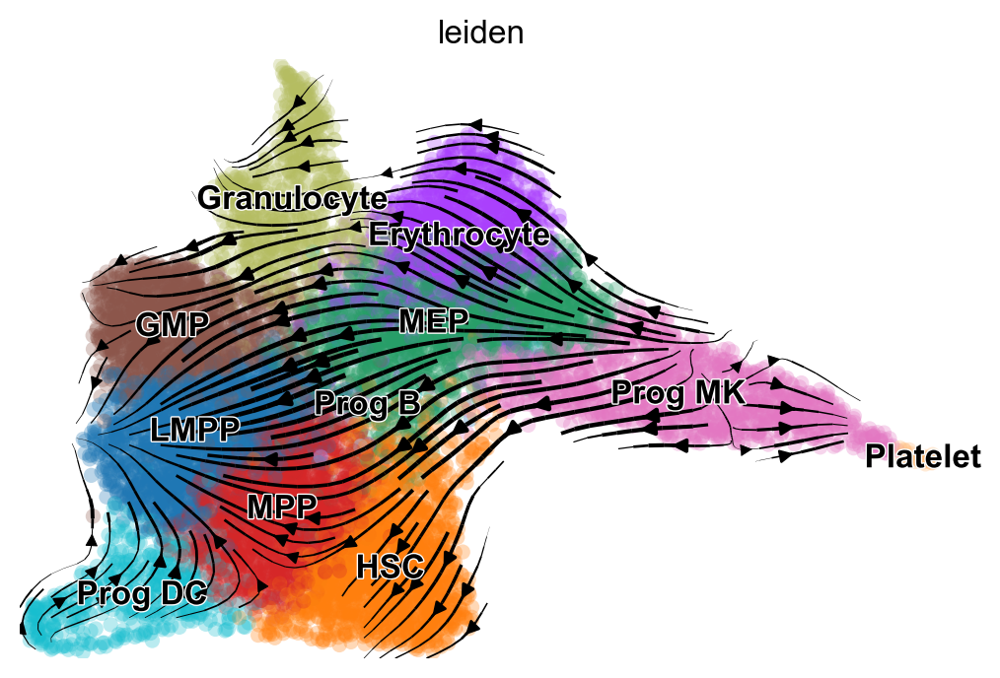

In [6]:
scv.tl.recover_dynamics(adata_rna)
scv.tl.velocity(adata_rna, mode="dynamical")
scv.tl.velocity_graph(adata_rna, n_jobs=1)
scv.tl.latent_time(adata_rna)
scv.pl.velocity_embedding_stream(adata_rna, basis='umap', color='leiden')

In [7]:
# This will take a while. Parallelization is high recommended.

adata_result = mv.recover_dynamics_chrom(adata_rna, 
                                        adata_atac,
                                        max_iter=5, 
                                        init_mode="invert",
                                        parallel=True,
                                        n_jobs = 10,
                                        save_plot=False,
                                        rna_only=False,
                                        fit=True,
                                        n_anchors=500, 
                                        extra_color_key='leiden'
                                        )

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


1000 genes will be fitted

running 10 jobs in parallel



  0%|          | 0/1000 [00:00<?, ?it/s]

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/umap_.py:662: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/umap_.py:662: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-p

AC004825.3 - predicted partial trajectory: True

AC004825.3 - predicted trajectory direction:on

AC004825.3 - predicted model: 1

AC004825.3 - initial params:
switch time array = [1. 2. 4.],
rates = [0.04993309 2.27364049 1.         0.72091702],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6413094663011089

AC004825.3 - initial loss: 0.12385451358010063

AC004825.3 - removing gaps and realigning by 7.420762916509568..

AC004825.3 - computing likelihood..

AC004825.3 - likelihood of c: 0.28171108025396097, likelihood of u: 0.32153744470029094, likelihood of s: 0.6990734182265329

AC004825.3 - computing velocities..

AC004825.3 - fitted params:
switch time array = [ 8.32101896 18.50811416 20.        ],
rates = [0.00302109 0.38630829 0.2856788  0.07364322],
cc scale = 0.9359669837528867,
c rescale factor = 0.9389098666547987,
u rescale factor = 0.8326217329482772

AC004825.3 - aligning to range (0,20) by 1.0824295010845988..

AC004825.3 - final params:
switch time array = 

AC004540.2 - predicted partial trajectory: False

AC004540.2 - predicted trajectory direction:complete

AC004540.2 - predicted model: 1

AC004540.2 - initial params:
switch time array = [ 5.          6.         11.90775528],
rates = [0.09702268 1.22441221 1.         1.08925361],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7773380543545727

AC004540.2 - initial loss: 0.00846462087516062

AC004540.2 - removing gaps and realigning by 1.0..

AC004540.2 - computing likelihood..

AC004540.2 - likelihood of c: 0.2373356958407362, likelihood of u: 0.42693144063762833, likelihood of s: 0.2907994949829572

AC004540.2 - computing velocities..

AC004540.2 - fitted params:
switch time array = [ 8.52888534 11.43939304 11.91683535],
rates = [0.06162412 1.16915772 0.91251026 1.17632509],
cc scale = 0.8569663107007275,
c rescale factor = 0.905228773659531,
u rescale factor = 0.7842802334309091

AC004540.2 - aligning to range (0,20) by 1.0..

AC004540.2 - final params:
switch time array

ABAT - predicted partial trajectory: True

ABAT - predicted trajectory direction:on

ABAT - predicted model: 1

ABAT - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.09840598 0.26723211 1.         1.17552434],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7022379331464433

ABAT - initial loss: 0.00044232531476546036

ABAT - removing gaps and realigning by 2.160276603312458..

ABAT - computing likelihood..

ABAT - likelihood of c: 0.24576980868123147, likelihood of u: 0.3023792428750235, likelihood of s: 0.6406326698129862

ABAT - computing velocities..

ABAT - fitted params:
switch time array = [11.68472752 19.50564606 20.        ],
rates = [0.03520633 0.11809679 1.79120766 0.46477869],
cc scale = 0.8400297550418141,
c rescale factor = 0.9369461299848081,
u rescale factor = 2.4233997277071584

ABAT - aligning to range (0,20) by 1.1289592760180995..

ABAT - final params:
switch time array = [11.2006313  20.03012983 20.58823529],
rates =

ABCA1 - predicted partial trajectory: False

ABCA1 - predicted trajectory direction:complete

ABCA1 - predicted model: 1

ABCA1 - initial params:
switch time array = [1.         4.         5.12930647],
rates = [0.10057021 0.41477216 1.         0.92196122],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.8441290404521489

ABCA1 - initial loss: 0.0007109493545097324

ABCA1 - removing gaps and realigning by 1.0..

ABCA1 - computing likelihood..

ABCA1 - likelihood of c: 0.2228890837149043, likelihood of u: 0.31875459321650773, likelihood of s: 0.24014210942678818

ABCA1 - computing velocities..

ABCA1 - fitted params:
switch time array = [0.99329168 4.01034741 5.16943592],
rates = [0.10573484 0.41833661 0.86673097 0.92196122],
cc scale = 1.0116735043186234,
c rescale factor = 1.0653769081301476,
u rescale factor = 0.8319816588129256

ABCA1 - aligning to range (0,20) by 1.0183673469387755..

ABCA1 - final params:
switch time array = [0.64418888 3.71665991 4.8970378 ],
rates = 

ABCC3 - predicted partial trajectory: True

ABCC3 - predicted trajectory direction:on

ABCC3 - predicted model: 1

ABCC3 - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.06430473 0.8298069  1.         1.48320072],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6595304149803201

ABCC3 - initial loss: 0.0015030782097412146

ABCC3 - removing gaps and realigning by 2.035406342660632..

ABCC3 - computing likelihood..

ABCC3 - likelihood of c: 0.09463745800067407, likelihood of u: 0.2925973092671428, likelihood of s: 0.3930138661307086

ABCC3 - computing velocities..

ABCC3 - fitted params:
switch time array = [11.0132217  19.50923188 20.        ],
rates = [0.04830555 0.78410781 0.42332152 0.69961558],
cc scale = 1.0813605136323197,
c rescale factor = 0.8940078785978347,
u rescale factor = 0.45509929959495266

ABCC3 - aligning to range (0,20) by 1.0267489711934157..

ABCC3 - final params:
switch time array = [11.30781405 20.03108377 20.534979

ABLIM1 - predicted partial trajectory: False

ABLIM1 - predicted trajectory direction:complete

ABLIM1 - predicted model: 1

ABLIM1 - initial params:
switch time array = [1.         6.         7.90775528],
rates = [0.06005721 1.27422812 1.         1.36997041],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.672589334015957

ABLIM1 - initial loss: 0.002499105183589046

ABLIM1 - removing gaps and realigning by 1.0059611793740693..

ABLIM1 - computing likelihood..

ABLIM1 - likelihood of c: 0.2644064308398717, likelihood of u: 0.717822912182035, likelihood of s: 0.7471471306178255

ABLIM1 - computing velocities..

ABLIM1 - fitted params:
switch time array = [ 0.99314339  6.93657451 11.81152738],
rates = [0.05748011 1.41304529 0.40645177 1.3189751 ],
cc scale = 1.129368770532094,
c rescale factor = 0.9704081299063798,
u rescale factor = 0.30817784648399504

ABLIM1 - aligning to range (0,20) by 1.0527426160337554..

ABLIM1 - final params:
switch time array = [-9.32795384e-03  6

ABHD2 - predicted partial trajectory: False

ABHD2 - predicted trajectory direction:complete

ABHD2 - predicted model: 1

ABHD2 - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.074968   7.51471214 1.         1.67961211],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.5874126419342073

ABHD2 - initial loss: 0.07091871999659378

ABHD2 - removing gaps and realigning by 1.3668012565075294..

ABHD2 - computing likelihood..

ABHD2 - likelihood of c: 0.2608163073194614, likelihood of u: 0.9106768145072008, likelihood of s: 0.6593879344087069

ABHD2 - computing velocities..

ABHD2 - fitted params:
switch time array = [ 4.147127    8.01775146 13.93444482],
rates = [0.05169388 4.68733768 0.42909351 1.21926296],
cc scale = 1.0192628596051048,
c rescale factor = 1.1959807291482256,
u rescale factor = 0.4131483538424099

ABHD2 - aligning to range (0,20) by 1.2632911392405064..

ABHD2 - final params:
switch time array = [-0.02679399  4.86293159 12.33

ABCC4 - predicted partial trajectory: False

ABCC4 - predicted trajectory direction:complete

ABCC4 - predicted model: 1

ABCC4 - initial params:
switch time array = [1.         6.         7.90775528],
rates = [ 0.14964364 13.70828689  1.          2.14646893],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.43650821825786285

ABCC4 - initial loss: 0.1555716425445525

ABCC4 - removing gaps and realigning by 1.0..

ABCC4 - computing likelihood..

ABCC4 - likelihood of c: 0.36185674163246984, likelihood of u: 1.0336879393631886, likelihood of s: 1.2396445395822107

ABCC4 - computing velocities..

ABCC4 - fitted params:
switch time array = [ 0.83916577  6.48967857 10.73952847],
rates = [ 0.16312439 14.02823701  0.83332367  2.05281447],
cc scale = 0.2510162313233474,
c rescale factor = 1.0776047246920002,
u rescale factor = 0.3460388417716793

ABCC4 - aligning to range (0,20) by 1.0439330543933054..

ABCC4 - final params:
switch time array = [-2.62819820e-03  5.89612889e+00  1.

AC005498.3 - predicted partial trajectory: False

AC005498.3 - predicted trajectory direction:complete

AC005498.3 - predicted model: 1

AC005498.3 - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.09311375 0.17420181 1.         1.03833051],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6315473520253803

AC005498.3 - initial loss: 0.00014369949539233204

AC005498.3 - removing gaps and realigning by 1.1493953209572445..

AC005498.3 - computing likelihood..

AC005498.3 - likelihood of c: 0.2328742347669397, likelihood of u: 0.2965316239564398, likelihood of s: 0.3251029313506529

AC005498.3 - computing velocities..

AC005498.3 - fitted params:
switch time array = [ 4.37564317  7.82496013 12.62196173],
rates = [0.08260927 0.14755127 0.9142374  0.93038401],
cc scale = 0.6370123889432411,
c rescale factor = 0.9653720107591235,
u rescale factor = 0.8050947158084306

AC005498.3 - aligning to range (0,20) by 1.3784530386740335..

AC005498.3 - f

AC004069.1 - predicted partial trajectory: True

AC004069.1 - predicted trajectory direction:on

AC004069.1 - predicted model: 1

AC004069.1 - initial params:
switch time array = [1. 2. 4.],
rates = [0.08279148 1.88986007 1.         0.5829555 ],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7965237090111253

AC004069.1 - initial loss: 0.07613606692954056

AC004069.1 - removing gaps and realigning by 4.821813557942026..

AC004069.1 - computing likelihood..

AC004069.1 - likelihood of c: 0.25956243952369806, likelihood of u: 0.1599110605111325, likelihood of s: 0.6787678856095856

AC004069.1 - computing velocities..

AC004069.1 - fitted params:
switch time array = [ 4.82926293 18.96561626 20.        ],
rates = [0.00445272 0.48532383 0.22895999 0.06054578],
cc scale = 0.7645410569670286,
c rescale factor = 1.5,
u rescale factor = 0.42263920340842254

AC004069.1 - aligning to range (0,20) by 1.0549682875264272..

AC004069.1 - final params:
switch time array = [ 5.09471924 20


ARHGAP26 - final params:
switch time array = [-0.11140748 14.19140347 16.50824027],
rates = [0.08462157 0.37111753 0.54118157 0.69293824],
cc scale = 0.9949074074074071,
c rescale factor = 0.9930555555555554,
u rescale factor = 0.6990398526260403

ARHGAP26 - final loss: 0.0019307753700810591

ARHGAP26 - final likelihood: 0.12014930533363832

ATP2B2 - low quality gene ATP2B2, skipping

ATP8B4 - predicted partial trajectory: False

ATP8B4 - predicted trajectory direction:complete

ATP8B4 - predicted model: 1

ATP8B4 - initial params:
switch time array = [1.         2.         7.90775528],
rates = [0.24881523 5.30386389 1.         2.02813004],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.4349507998548972

ATP8B4 - initial loss: 0.027817559304289276

ATP8B4 - removing gaps and realigning by 1.0329066369958515..

ATP8B4 - computing likelihood..

ATP8B4 - likelihood of c: 0.4022567815187422, likelihood of u: 0.9922773501145519, likelihood of s: 0.7650124755674166

ATP8B4 - c

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

ARSD - fitted params:
switch time array = [ 1.13787634  2.06898139 26.84770235],
rates = [0.18346328 0.50365465 0.88824253 1.00179765],
cc scale = 1.6850928494773183,
c rescale factor = 1.1217166752522183,
u rescale factor = 0.8368575827668825

ARSD - aligning to range (0,20) by 1.0374220374220375..

ARSD - final params:
switch time array = [ 0.43201725  1.39796614 27.10395733],
rates = [0.17684537 0.48548675 0.85620171 0.96566066],
cc scale = 1.6850928494773183,
c rescale factor = 1.1217166752522183,
u rescale factor = 0.8368575827668825

ARSD - final loss: 0.001563462781970125

ARSD - final likelihood: 0.06805471664492109

AZU1 - predicted partial trajectory: False

AZU1 - predicted trajectory direction:complete

AZU1 - predicted model: 1

AZU1 - initial params:
switch time array = [1.         6.         7.90775528],
rates = [ 0.09845686 72.67635082  1.          1.6830016 ],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.5640907605707086

AZU1 - initial loss: 2.54021085

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

ATAD5 - likelihood of c: 0.25102515578301027, likelihood of u: 0.5528296064106157, likelihood of s: 0.5990703704994754

ATAD5 - computing velocities..

ATAD5 - fitted params:
switch time array = [2.99053316 6.2751114  7.69072259],
rates = [0.04515445 8.5888763  1.02642418 1.75415845],
cc scale = 0.9874999999999999,
c rescale factor = 1.0375,
u rescale factor = 0.6237488278997005

ATAD5 - aligning to range (0,20) by 2.7267759562841536..

ATAD5 - final params:
switch time array = [-0.04220738  8.91410159 12.77415613],
rates = [0.01655965 3.14982838 0.3764241  0.64330861],
cc scale = 0.9874999999999999,
c rescale factor = 1.0375,
u rescale factor = 0.6237488278997005

ATAD5 - final loss: 0.048230039678490585

ATAD5 - final likelihood: 0.08313547430975067

BAALC - predicted partial trajectory: False

BAALC - predicted trajectory direction:complete

BAALC - predicted model: 1

BAALC - initial params:
switch time array = [1.         4.         7.90775528],
rates = [0.12196977 4.6550455  1.  

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

ARHGAP33 - fitted params:
switch time array = [12.34301323 19.38337172 20.        ],
rates = [0.0348139  0.10509422 1.56778382 0.46579634],
cc scale = 0.5860136641150329,
c rescale factor = 0.9217282561835807,
u rescale factor = 1.72335186257241

ARHGAP33 - aligning to range (0,20) by 2.851428571428572..

ARHGAP33 - final params:
switch time array = [-4.77941018e-03  2.00702999e+01  2.18285714e+01],
rates = [0.01220928 0.03685669 0.54982399 0.16335543],
cc scale = 0.5860136641150329,
c rescale factor = 0.9217282561835807,
u rescale factor = 1.72335186257241

ARHGAP33 - final loss: 0.00019901306107364297

ARHGAP33 - final likelihood: 0.04032609814750343

ASPM - predicted partial trajectory: False

ASPM - predicted trajectory direction:complete

ASPM - predicted model: 2

ASPM - initial params:
switch time array = [ 5.         11.90775528 12.90775528],
rates = [0.04120155 9.57724227 1.         1.88046308],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.4822711800233199

ASP

BAALC-AS1 - likelihood of c: 0.23456049530014053, likelihood of u: 0.31832458284793286, likelihood of s: 0.4693212999384495

BAALC-AS1 - computing velocities..

BAALC-AS1 - fitted params:
switch time array = [2.13511376 2.49085171 5.26490039],
rates = [0.14302347 0.17058365 0.86574057 0.81084839],
cc scale = 1.1792760754980445,
c rescale factor = 1.0251528687574822,
u rescale factor = 0.776953680548941

BAALC-AS1 - aligning to range (0,20) by 1.3977591036414565..

BAALC-AS1 - final params:
switch time array = [2.70426264 3.20149861 7.07895041],
rates = [0.1023234  0.12204081 0.61937753 0.58010597],
cc scale = 1.1792760754980445,
c rescale factor = 1.0251528687574822,
u rescale factor = 0.776953680548941

BAALC-AS1 - final loss: 0.00012897586286189855

BAALC-AS1 - final likelihood: 0.035042518683790894

BDNF - predicted partial trajectory: True

BDNF - predicted trajectory direction:on

BDNF - predicted model: 1

BDNF - initial params:
switch time array = [3.         6.         9.907755

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

APOL3 - fitted params:
switch time array = [1.23396868 7.01329201 7.28723529],
rates = [0.03116801 0.61247063 0.41557184 0.97704709],
cc scale = 0.9132860463224577,
c rescale factor = 1.0266031735705887,
u rescale factor = 0.45981215323410296

APOL3 - aligning to range (0,20) by 1.0662393162393162..

APOL3 - final params:
switch time array = [-0.0090804   6.15306135  6.44515045],
rates = [0.02923172 0.57442135 0.38975475 0.91634877],
cc scale = 0.9132860463224577,
c rescale factor = 1.0266031735705887,
u rescale factor = 0.45981215323410296

APOL3 - final loss: 0.0005430794051257646

APOL3 - final likelihood: 0.0562699325048166

ATP10D - predicted partial trajectory: False

ATP10D - predicted trajectory direction:complete

ATP10D - predicted model: 2

ATP10D - initial params:
switch time array = [ 3.          9.90775528 10.90775528],
rates = [0.04880644 1.91090935 1.         1.73437546],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.5742895978932652

ATP10D - initial los

ARL5B - final params:
switch time array = [-4.19654631e-03  3.05231255e+00  4.60454476e+00],
rates = [0.05221898 0.24939618 0.32872848 0.27963415],
cc scale = 0.4200893607737525,
c rescale factor = 1.089846347144352,
u rescale factor = 0.7857749806544896

ARL5B - final loss: 0.0020110867180680794

ARL5B - final likelihood: 0.046959284688439115

ARRDC3-AS1 - predicted partial trajectory: True

ARRDC3-AS1 - predicted trajectory direction:on

ARRDC3-AS1 - predicted model: 1

ARRDC3-AS1 - initial params:
switch time array = [1. 2. 4.],
rates = [0.25771003 0.12106256 1.         0.84599521],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.5750863866957334

ARRDC3-AS1 - initial loss: 7.90527761621185e-05

ARRDC3-AS1 - removing gaps and realigning by 4.761245186852263..

ARRDC3-AS1 - computing likelihood..

ARRDC3-AS1 - likelihood of c: 0.23495102201338183, likelihood of u: 0.15217227398817645, likelihood of s: 0.09331382914487575

ARRDC3-AS1 - computing velocities..

ARRDC3-AS1 -

ATP6V0A2 - fitted params:
switch time array = [ 6.05120562 14.35816145 14.59889176],
rates = [ 0.03221101 15.3170872   0.62997839  2.12716195],
cc scale = 1.0862939740899566,
c rescale factor = 0.9787966386959545,
u rescale factor = 0.3476797430468792

ATP6V0A2 - aligning to range (0,20) by 1.4421965317919074..

ATP6V0A2 - final params:
switch time array = [-0.11690288 11.86336001 12.21054043],
rates = [ 0.02233469 10.62066568  0.43681868  1.47494596],
cc scale = 1.0862939740899566,
c rescale factor = 0.9787966386959545,
u rescale factor = 0.3476797430468792

ATP6V0A2 - final loss: 0.12515992970266604

ATP6V0A2 - final likelihood: 0.1899476047832408

B4GALT5 - predicted partial trajectory: False

B4GALT5 - predicted trajectory direction:complete

B4GALT5 - predicted model: 2

B4GALT5 - initial params:
switch time array = [ 5.         11.90775528 12.90775528],
rates = [0.03604664 2.89304621 1.         1.52752208],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.619723731887

BAHCC1 - final params:
switch time array = [-0.02254805  5.63360918  8.39096732],
rates = [0.13674362 1.25241416 0.66219994 1.09013611],
cc scale = 0.9896176268861452,
c rescale factor = 0.9903034979423868,
u rescale factor = 0.4837462235300819

BAHCC1 - final loss: 0.00828542741566822

BAHCC1 - final likelihood: 0.16729668143592694

BRCA2 - predicted partial trajectory: False

BRCA2 - predicted trajectory direction:complete

BRCA2 - predicted model: 1

BRCA2 - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.09141175 3.67136412 1.         1.62004687],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.5766913825636145

BRCA2 - initial loss: 0.026420899468885428

BRCA2 - removing gaps and realigning by 1.618548154707053..

BRCA2 - computing likelihood..

BRCA2 - likelihood of c: 0.25688869076258747, likelihood of u: 0.6607083866880461, likelihood of s: 0.5679736376366615

BRCA2 - computing velocities..

BRCA2 - fitted params:
switch time arra

CTNNBL1 - fitted params:
switch time array = [ 1.86969264 10.16583566 13.75318586],
rates = [0.10168106 2.78087724 0.56835348 1.01400812],
cc scale = 0.6491760993486695,
c rescale factor = 1.0005611717511806,
u rescale factor = 0.5325917879748538

CTNNBL1 - aligning to range (0,20) by 1.1213483146067416..

CTNNBL1 - final params:
switch time array = [-0.3303896   8.9724764  12.99514549],
rates = [0.0906775  2.47994062 0.50684829 0.90427577],
cc scale = 0.6491760993486695,
c rescale factor = 1.0005611717511806,
u rescale factor = 0.5325917879748538

CTNNBL1 - final loss: 0.058053366791472105

CTNNBL1 - final likelihood: 0.25065704265412214

CYSLTR2 - predicted partial trajectory: False

CYSLTR2 - predicted trajectory direction:complete

CYSLTR2 - predicted model: 1

CYSLTR2 - initial params:
switch time array = [1. 2. 4.],
rates = [0.19538704 0.14052434 1.         0.70111986],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.8859972453842442

CYSLTR2 - initial loss: 9.654489

EPHB1 - low quality gene EPHB1, skipping

ERO1B - predicted partial trajectory: False

ERO1B - predicted trajectory direction:complete

ERO1B - predicted model: 1

ERO1B - initial params:
switch time array = [1.         2.         7.90775528],
rates = [0.27505597 1.64787043 1.         1.58368151],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6414081809695377

ERO1B - initial loss: 0.0062891893249981965

ERO1B - removing gaps and realigning by 2.603051746536393..

ERO1B - computing likelihood..

ERO1B - likelihood of c: 0.240000528467599, likelihood of u: 0.4631113097417279, likelihood of s: 0.6023371493000317

ERO1B - computing velocities..

ERO1B - fitted params:
switch time array = [ 2.75073804  4.90213851 20.        ],
rates = [0.10419914 0.66051645 0.42947047 0.68669711],
cc scale = 1.4841339641297577,
c rescale factor = 1.0029769358482605,
u rescale factor = 0.653791659108965

ERO1B - aligning to range (0,20) by 1.1686182669789227..

ERO1B - final params:
switch ti

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

BTG1 - likelihood of c: 0.22064696470031875, likelihood of u: 0.0826353514571225, likelihood of s: 0.7326580453223027

BTG1 - computing velocities..

BTG1 - fitted params:
switch time array = [ 0.87067063 19.12713035 20.        ],
rates = [0.03996153 0.93338309 0.2728643  0.14006777],
cc scale = 0.9011176403708798,
c rescale factor = 1.0203579993066034,
u rescale factor = 0.2303282895906819

BTG1 - aligning to range (0,20) by 1.0967032967032968..

BTG1 - final params:
switch time array = [-1.21656169e-02  2.00097539e+01  2.09670330e+01],
rates = [0.03643787 0.85108077 0.24880412 0.12771711],
cc scale = 0.9011176403708798,
c rescale factor = 1.0203579993066034,
u rescale factor = 0.2303282895906819

BTG1 - final loss: 0.07862166911389144

BTG1 - final likelihood: 0.013358729594348938

C1QTNF4 - predicted partial trajectory: False

C1QTNF4 - predicted trajectory direction:complete

C1QTNF4 - predicted model: 2

C1QTNF4 - initial params:
switch time array = [ 3.          9.90775528 10.907

DAAM1 - fitted params:
switch time array = [ 5.55843648 19.4451607  20.        ],
rates = [ 0.08105502 17.36527189  0.49093084  2.23104431],
cc scale = 0.91209909025933,
c rescale factor = 0.9125284507893168,
u rescale factor = 0.2

DAAM1 - aligning to range (0,20) by 1.0288659793814432..

DAAM1 - final params:
switch time array = [ 5.7188862  20.00646431 20.57731959],
rates = [ 0.07878093 16.87806987  0.47715723  2.16844988],
cc scale = 0.91209909025933,
c rescale factor = 0.9125284507893168,
u rescale factor = 0.2

DAAM1 - final loss: 0.11925911211922291

DAAM1 - final likelihood: 0.10394499033146216

DIAPH2 - predicted partial trajectory: False

DIAPH2 - predicted trajectory direction:complete

DIAPH2 - predicted model: 1

DIAPH2 - initial params:
switch time array = [1.         4.         7.90775528],
rates = [ 0.07024776 14.25739101  1.          2.80754361],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.33304006769414013

DIAPH2 - initial loss: 0.023067504511180087


DDHD1 - predicted partial trajectory: False

DDHD1 - predicted trajectory direction:complete

DDHD1 - predicted model: 1

DDHD1 - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.08754446 1.1802521  1.         1.45697711],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6459118814469089

DDHD1 - initial loss: 0.0037580391656439663

DDHD1 - removing gaps and realigning by 1.0393430141816986..

DDHD1 - computing likelihood..

DDHD1 - likelihood of c: 0.26776994479122423, likelihood of u: 0.4806746080015006, likelihood of s: 0.5512761609187717

DDHD1 - computing velocities..

DDHD1 - fitted params:
switch time array = [3.22171055 7.24516663 9.7468248 ],
rates = [0.08001905 1.1295918  0.96322758 1.47680356],
cc scale = 0.9116227795777183,
c rescale factor = 0.9520891749095861,
u rescale factor = 0.6466322556430004

DDHD1 - aligning to range (0,20) by 1.196642685851319..

DDHD1 - final params:
switch time array = [-0.07761735  4.73702194  7.730

DTX4 - predicted partial trajectory: False

DTX4 - predicted trajectory direction:complete

DTX4 - predicted model: 2

DTX4 - initial params:
switch time array = [ 5.         11.90775528 12.90775528],
rates = [0.0386854  0.40949526 1.         1.10916603],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7999345835243604

DTX4 - initial loss: 0.0007042885346181115

DTX4 - removing gaps and realigning by 1.0..

DTX4 - computing likelihood..

DTX4 - likelihood of c: 0.23201675688869483, likelihood of u: 0.08977786139948546, likelihood of s: 0.1012092722034614

DTX4 - computing velocities..

DTX4 - fitted params:
switch time array = [ 5.1571272  11.90635401 12.86949707],
rates = [0.03825408 0.40949526 1.         1.10916603],
cc scale = 0.9781181168652733,
c rescale factor = 0.9847787950251213,
u rescale factor = 0.8024343790978739

DTX4 - aligning to range (0,20) by 1.0483193277310925..

DTX4 - final params:
switch time array = [ 4.43992957 11.51527448 12.52495597],
rates = [0.

CRIM1 - computing velocities..

CRIM1 - fitted params:
switch time array = [1.38961429 6.06926377 9.60327913],
rates = [0.08219963 0.30850998 0.46594207 0.76134151],
cc scale = 1.0601525798668698,
c rescale factor = 1.0314477372518702,
u rescale factor = 0.664450752948168

CRIM1 - aligning to range (0,20) by 1.0754310344827587..

CRIM1 - final params:
switch time array = [-0.01418636  5.01845392  8.81904372],
rates = [0.07643412 0.28687101 0.43326076 0.70794081],
cc scale = 1.0601525798668698,
c rescale factor = 1.0314477372518702,
u rescale factor = 0.664450752948168

CRIM1 - final loss: 0.0007847799129187693

CRIM1 - final likelihood: 0.051206634209561716

CTSG - predicted partial trajectory: True

CTSG - predicted trajectory direction:on

CTSG - predicted model: 1

CTSG - initial params:
switch time array = [1.         2.         4.35228095],
rates = [ 0.15266195 27.79921956  1.          0.75860306],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7223967307747843

CTSG

CTTN - predicted partial trajectory: True

CTTN - predicted trajectory direction:on

CTTN - predicted model: 1

CTTN - initial params:
switch time array = [ 5.          6.         11.90775528],
rates = [0.08284728 1.37811079 1.         3.3680852 ],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.3103349016222912

CTTN - initial loss: 0.0013339229347250196

CTTN - removing gaps and realigning by 1.8027915727602661..

CTTN - computing likelihood..

CTTN - likelihood of c: 0.08685006524684231, likelihood of u: 0.23489428964934791, likelihood of s: 0.25735340559431086

CTTN - computing velocities..

CTTN - fitted params:
switch time array = [ 7.80404808 19.61120892 20.        ],
rates = [0.12087676 0.96451819 0.55469529 1.72770356],
cc scale = 1.0942648921065588,
c rescale factor = 0.75,
u rescale factor = 0.3103349016222912

CTTN - aligning to range (0,20) by 1.0204498977505114..

CTTN - final params:
switch time array = [ 7.96364007 20.01225613 20.40899796],
rates = [0.11845

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/umap_.py:662: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


FBN1 - predicted partial trajectory: False

FBN1 - predicted trajectory direction:complete

FBN1 - predicted model: 1

FBN1 - initial params:
switch time array = [1.         6.         7.90775528],
rates = [0.11003913 1.02629762 1.         1.24460806],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7183319575962068

FBN1 - initial loss: 0.0033225310027820165

FBN1 - removing gaps and realigning by 1.202815482557717..

FBN1 - computing likelihood..

FBN1 - likelihood of c: 0.2883505120603757, likelihood of u: 0.49872318733224735, likelihood of s: 0.5495019837343929

FBN1 - computing velocities..

FBN1 - fitted params:
switch time array = [1.32119894 6.99417881 9.78409382],
rates = [0.0833386  0.85366272 0.81551426 1.04454741],
cc scale = 0.9607708217311139,
c rescale factor = 1.1177147991866874,
u rescale factor = 0.6860904237218582

FBN1 - aligning to range (0,20) by 1.0040241448692153..

FBN1 - final params:
switch time array = [1.24603274 6.9418415  9.74298353],
rates =

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

GLIPR1 - predicted partial trajectory: False

GLIPR1 - predicted trajectory direction:complete

GLIPR1 - predicted model: 2

GLIPR1 - initial params:
switch time array = [1.         7.90775528 8.90775528],
rates = [0.04083788 5.21383816 1.         1.21656769],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7001983104483614

GLIPR1 - initial loss: 0.05240428693191365

GLIPR1 - removing gaps and realigning by 1.6242696824608793..

GLIPR1 - computing likelihood..

GLIPR1 - likelihood of c: 0.25033111037673095, likelihood of u: 0.49835003486642715, likelihood of s: 0.6117998649164392

GLIPR1 - computing velocities..

GLIPR1 - fitted params:
switch time array = [ 1.49338446 12.95328931 14.71840611],
rates = [0.02667428 3.0807871  0.62846942 0.74812255],
cc scale = 1.0298534423608992,
c rescale factor = 1.0594562847003917,
u rescale factor = 0.6840103488954232

GLIPR1 - aligning to range (0,20) by 1.0824295010845988..

GLIPR1 - final params:
switch time array = [-0.03210663 12.

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

GIMAP1 - predicted partial trajectory: True

GIMAP1 - predicted trajectory direction:on

GIMAP1 - predicted model: 1

GIMAP1 - initial params:
switch time array = [1. 2. 4.],
rates = [0.18061207 0.50554148 1.         0.42158605],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.877175102830218

GIMAP1 - initial loss: 0.0029303181673392374

GIMAP1 - removing gaps and realigning by 4.90688041147583..

GIMAP1 - computing likelihood..

GIMAP1 - likelihood of c: 0.18202809519765353, likelihood of u: 0.055056761350797644, likelihood of s: 0.5863999942864089

GIMAP1 - computing velocities..

GIMAP1 - fitted params:
switch time array = [ 1.18042549 18.88954752 20.        ],
rates = [0.02295108 0.12682427 0.25704364 0.04618056],
cc scale = 0.7188730154340361,
c rescale factor = 1.2195048145740646,
u rescale factor = 0.3886891302098199

GIMAP1 - aligning to range (0,20) by 1.1315192743764173..

GIMAP1 - final params:
switch time array = [-0.02487002 20.01334288 21.26984127],
rates = 

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

HESX1 - predicted partial trajectory: True

HESX1 - predicted trajectory direction:on

HESX1 - predicted model: 1

HESX1 - initial params:
switch time array = [3.         4.         7.10633355],
rates = [0.12933589 0.19186581 1.         0.96323359],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6370718018886643

HESX1 - initial loss: 0.00022333830970168943

HESX1 - removing gaps and realigning by 3.0414000813948334..

HESX1 - computing likelihood..

HESX1 - likelihood of c: 0.24429733802289874, likelihood of u: 0.27559816038347124, likelihood of s: 0.4520448860676459

HESX1 - computing velocities..

HESX1 - fitted params:
switch time array = [10.48245084 19.38123004 20.        ],
rates = [0.03597268 0.0602063  0.60594597 0.28530907],
cc scale = 0.579426259409547,
c rescale factor = 0.9007091484797769,
u rescale factor = 1.2236850419022254

HESX1 - aligning to range (0,20) by 1.1577726218097448..

HESX1 - final params:
switch time array = [ 9.72330155 20.02606448 20.74245

HES1 - low quality gene HES1, skipping

HGD - predicted partial trajectory: False

HGD - predicted trajectory direction:complete

HGD - predicted model: 2

HGD - initial params:
switch time array = [ 5.         11.90775528 12.90775528],
rates = [0.01435792 2.19754691 1.         1.08620879],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7555456237577695

HGD - initial loss: 0.0023141798239271188

HGD - removing gaps and realigning by 1.1079360924905215..

HGD - computing likelihood..

HGD - likelihood of c: 0.22068116747355634, likelihood of u: 0.287483826304189, likelihood of s: 0.35087287663490413

HGD - computing velocities..

HGD - fitted params:
switch time array = [ 4.78394529 10.73164579 10.96273279],
rates = [0.01776432 2.35541251 0.86508748 0.88370991],
cc scale = 2.4781012910825346,
c rescale factor = 0.75,
u rescale factor = 0.7954015655090776

HGD - aligning to range (0,20) by 1.0..

HGD - final params:
switch time array = [ 4.78394529 10.73164579 10.96273279]

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

CTAG2 - likelihood of c: 0.3146693845502984, likelihood of u: 0.42451679251643754, likelihood of s: 0.36339391677608174

CTAG2 - computing velocities..

CTAG2 - fitted params:
switch time array = [ 2.17738615  7.00005845 46.03467174],
rates = [2.20059674e-03 1.42929421e+01 4.44040551e-01 3.57135223e-01],
cc scale = 1.9981481481481516,
c rescale factor = 0.75,
u rescale factor = 0.7143285747780361

CTAG2 - aligning to range (0,20) by 1.1238738738738738..

CTAG2 - final params:
switch time array = [-3.03700703e-02  5.38970533e+00  4.92596874e+01],
rates = [1.95804600e-03 1.27175677e+01 3.95098205e-01 3.17771622e-01],
cc scale = 1.9981481481481516,
c rescale factor = 0.75,
u rescale factor = 0.7143285747780361

CTAG2 - final loss: 0.03363299237318236

CTAG2 - final likelihood: 0.048543045296418424

CYTL1 - predicted partial trajectory: False

CYTL1 - predicted trajectory direction:complete

CYTL1 - predicted model: 2

CYTL1 - initial params:
switch time array = [1.         7.90775528 8.90

DUSP6 - removing gaps and realigning by 3.4508071930178814..

DUSP6 - computing likelihood..

DUSP6 - likelihood of c: 0.1692308797597023, likelihood of u: 0.18848270464683795, likelihood of s: 0.771965765527054

DUSP6 - computing velocities..

DUSP6 - fitted params:
switch time array = [ 0.71474484 18.82314176 20.        ],
rates = [0.04220461 0.55228557 0.29122091 0.16216246],
cc scale = 0.8371584589479377,
c rescale factor = 1.140090383340997,
u rescale factor = 0.44821214569186785

DUSP6 - aligning to range (0,20) by 1.106430155210643..

DUSP6 - final params:
switch time array = [-7.41091943e-03  2.00282655e+01  2.13303769e+01],
rates = [0.03814485 0.4991599  0.26320768 0.14656367],
cc scale = 0.8371584589479377,
c rescale factor = 1.140090383340997,
u rescale factor = 0.44821214569186785

DUSP6 - final loss: 0.022942337210866817

DUSP6 - final likelihood: 0.024623464531346482

ENO2 - predicted partial trajectory: True

ENO2 - predicted trajectory direction:on

ENO2 - predicted mod

GRAP2 - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.08510699 2.93607532 1.         1.83026465],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.493099770837535

GRAP2 - initial loss: 0.00484443449950513

GRAP2 - removing gaps and realigning by 1.7119007415858605..

GRAP2 - computing likelihood..

GRAP2 - likelihood of c: 0.18670724715309078, likelihood of u: 0.3143112897158773, likelihood of s: 0.40697621067669815

GRAP2 - computing velocities..

GRAP2 - fitted params:
switch time array = [ 8.03639126 19.42272524 20.        ],
rates = [0.0343855  2.10639542 0.2781593  1.24240883],
cc scale = 1.0655314778998985,
c rescale factor = 0.9578015866592358,
u rescale factor = 0.2

GRAP2 - aligning to range (0,20) by 1.03099173553719..

GRAP2 - final params:
switch time array = [ 8.28545297 20.02466921 20.61983471],
rates = [0.03335187 2.04307692 0.2697978  1.20506187],
cc scale = 1.0655314778998985,
c rescale factor = 0.9578015866592358,
u re

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

HLF - initial params:
switch time array = [3.         6.         9.90775528],
rates = [0.14390219 0.88260498 1.         1.5540194 ],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.5998025909633651

HLF - initial loss: 0.0011332510146821134

HLF - removing gaps and realigning by 2.156891160024409..

HLF - computing likelihood..

HLF - likelihood of c: 0.2593077397274137, likelihood of u: 0.34019602413847794, likelihood of s: 0.545852590130011

HLF - computing velocities..

HLF - fitted params:
switch time array = [ 9.1953215  19.28563369 20.        ],
rates = [0.0657428  0.47494812 0.46757806 0.53379144],
cc scale = 0.9022816398498277,
c rescale factor = 0.8645478040173393,
u rescale factor = 0.5993831688197997

HLF - aligning to range (0,20) by 1.0374220374220375..

HLF - final params:
switch time array = [ 9.53942916 20.00734139 20.74844075],
rates = [0.06337132 0.45781573 0.45071152 0.51453644],
cc scale = 0.9022816398498277,
c rescale factor = 0.8645478040173393,
u res

/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python3.9/site-packages/umap_learn-0.5.3-py3.9.egg/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jake/opt/anaconda3/lib/python

GKAP1 - predicted partial trajectory: False

GKAP1 - predicted trajectory direction:complete

GKAP1 - predicted model: 1

GKAP1 - initial params:
switch time array = [1.         2.         7.90775528],
rates = [0.27507693 0.70916985 1.         1.11693677],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.676873709819586

GKAP1 - initial loss: 0.0023963758760218268

GKAP1 - removing gaps and realigning by 1.0094445198860857..

GKAP1 - computing likelihood..

GKAP1 - likelihood of c: 0.23881296170074662, likelihood of u: 0.37964515929586024, likelihood of s: 0.7077216870451176

GKAP1 - computing velocities..

GKAP1 - fitted params:
switch time array = [ 0.88931574  1.61071315 20.        ],
rates = [0.25296803 0.72187351 0.8703605  1.16502538],
cc scale = 1.6366701174921416,
c rescale factor = 1.1555074861526393,
u rescale factor = 0.6039746185373769

GKAP1 - aligning to range (0,20) by 1.313157894736842..

GKAP1 - final params:
switch time array = [-0.04271432  0.90459438 25.

HOXA9 - predicted partial trajectory: False

HOXA9 - predicted trajectory direction:complete

HOXA9 - predicted model: 2

HOXA9 - initial params:
switch time array = [ 3.          9.90775528 10.90775528],
rates = [0.04615113 2.5720972  1.         1.03620311],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7824820310029672

HOXA9 - initial loss: 0.028571099254202145

HOXA9 - removing gaps and realigning by 1.2205951072872172..

HOXA9 - computing likelihood..

HOXA9 - likelihood of c: 0.2343420554308929, likelihood of u: 0.41345804522633633, likelihood of s: 0.4629443755359259

HOXA9 - computing velocities..

HOXA9 - fitted params:
switch time array = [ 4.00676096 12.7154366  12.96067014],
rates = [0.03416774 2.39733376 0.80083389 0.92048652],
cc scale = 1.239425943098162,
c rescale factor = 0.9890227525151427,
u rescale factor = 0.7695776450104339

HOXA9 - aligning to range (0,20) by 1.2474999999999998..

HOXA9 - final params:
switch time array = [ 0.0484343  10.91250716 1

TPSB2 - fitted params:
switch time array = [ 9.6657848  19.33573256 20.        ],
rates = [0.00912201 1.21551048 0.73865358 0.48605933],
cc scale = 0.6363175789386726,
c rescale factor = 1.5,
u rescale factor = 1.1841689041056944

TPSB2 - aligning to range (0,20) by 1.0352697095435686..

TPSB2 - final params:
switch time array = [10.00669422 20.01769823 20.70539419],
rates = [0.00881124 1.1741003  0.71348902 0.46950019],
cc scale = 0.6363175789386726,
c rescale factor = 1.5,
u rescale factor = 1.1841689041056944

TPSB2 - final loss: 0.0004027244990444828

TPSB2 - final likelihood: 0.009246684348247582

TRH - predicted partial trajectory: True

TRH - predicted trajectory direction:on

TRH - predicted model: 1

TRH - initial params:
switch time array = [1. 2. 4.],
rates = [0.13130665 3.21142675 1.         0.62055394],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.745162384783829

TRH - initial loss: 0.05347277928515426

TRH - removing gaps and realigning by 4.9221148035682

MTUS1 - predicted partial trajectory: False

MTUS1 - predicted trajectory direction:complete

MTUS1 - predicted model: 2

MTUS1 - initial params:
switch time array = [3.         6.89104549 7.89104549],
rates = [0.0511721  0.44947    1.         0.86997357],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.845062016745366

MTUS1 - initial loss: 0.00048034445898040214

MTUS1 - removing gaps and realigning by 1.0..

MTUS1 - computing likelihood..

MTUS1 - likelihood of c: 0.20985506452901329, likelihood of u: 0.29878543465365953, likelihood of s: 0.30502517914318594

MTUS1 - computing velocities..

MTUS1 - fitted params:
switch time array = [2.56490741 6.63347876 7.2170653 ],
rates = [0.06854533 0.71749667 1.12434857 1.33890215],
cc scale = 1.1261414241062342,
c rescale factor = 0.9654119031875281,
u rescale factor = 0.8458538733208045

MTUS1 - aligning to range (0,20) by 1.0121703853955375..

MTUS1 - final params:
switch time array = [2.35271562 6.47080304 7.06149205],
rates =

HLA-DRA - predicted partial trajectory: False

HLA-DRA - predicted trajectory direction:complete

HLA-DRA - predicted model: 2

HLA-DRA - initial params:
switch time array = [ 5.         11.90775528 16.90775528],
rates = [2.93570909e-02 5.64660453e+01 1.00000000e+00 1.59955032e+00],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.529987890419523

HLA-DRA - initial loss: 5.726102172039226

HLA-DRA - removing gaps and realigning by 1.3122669613183549..

HLA-DRA - computing likelihood..

HLA-DRA - likelihood of c: 0.2369111679538761, likelihood of u: 0.4346237184410991, likelihood of s: 0.42616326661393883

HLA-DRA - computing velocities..

HLA-DRA - fitted params:
switch time array = [ 7.09836229 15.48734099 27.08988279],
rates = [2.24707794e-02 5.10586535e+01 7.56452000e-01 1.22332790e+00],
cc scale = 0.8796363890680601,
c rescale factor = 0.8955922526020625,
u rescale factor = 0.5414753321898536

HLA-DRA - aligning to range (0,20) by 1.1039823008849559..

HLA-DRA - final p

HLA-DQB1 - predicted partial trajectory: False

HLA-DQB1 - predicted trajectory direction:complete

HLA-DQB1 - predicted model: 1

HLA-DQB1 - initial params:
switch time array = [1.         4.         7.90775528],
rates = [0.14167249 4.65090781 1.         2.05283398],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.4710592794373295

HLA-DQB1 - initial loss: 0.03264059218586976

HLA-DQB1 - removing gaps and realigning by 1.6177010160725478..

HLA-DQB1 - computing likelihood..

HLA-DQB1 - likelihood of c: 0.24860067298598704, likelihood of u: 0.5123447939635413, likelihood of s: 0.9198510321105294

HLA-DQB1 - computing velocities..

HLA-DQB1 - fitted params:
switch time array = [ 1.58755842  7.8425539  20.        ],
rates = [0.09944548 3.68144577 0.61229664 0.90583179],
cc scale = 1.370130089548834,
c rescale factor = 1.0791922065176456,
u rescale factor = 0.40616531943952316

HLA-DQB1 - aligning to range (0,20) by 2.38755980861244..

HLA-DQB1 - final params:
switch time arr

HOXA10-AS - predicted partial trajectory: False

HOXA10-AS - predicted trajectory direction:complete

HOXA10-AS - predicted model: 2

HOXA10-AS - initial params:
switch time array = [3.         6.77482675 9.77482675],
rates = [0.04315506 1.20110688 1.         0.84584548],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.7125659757369573

HOXA10-AS - initial loss: 0.006472228020113018

HOXA10-AS - removing gaps and realigning by 1.8034755294671634..

HOXA10-AS - computing likelihood..

HOXA10-AS - likelihood of c: 0.23203339500324766, likelihood of u: 0.4817019264831051, likelihood of s: 0.3661953810957286

HOXA10-AS - computing velocities..

HOXA10-AS - fitted params:
switch time array = [ 6.62733177 11.78188257 18.7361408 ],
rates = [0.02335136 0.91444775 0.5060774  0.53091942],
cc scale = 0.9847891135651887,
c rescale factor = 0.8386512403789225,
u rescale factor = 0.8578646010362108

HOXA10-AS - aligning to range (0,20) by 1.0..

HOXA10-AS - final params:
switch time arr

GRAMD1B - predicted partial trajectory: False

GRAMD1B - predicted trajectory direction:complete

GRAMD1B - predicted model: 1

GRAMD1B - initial params:
switch time array = [1.         2.         7.90775528],
rates = [0.25157883 0.73231168 1.         1.39721534],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6475925210501435

GRAMD1B - initial loss: 0.0008529377501694754

GRAMD1B - removing gaps and realigning by 1.2796632888591746..

GRAMD1B - computing likelihood..

GRAMD1B - likelihood of c: 0.2695266195920411, likelihood of u: 0.4963594133710173, likelihood of s: 0.5628123500606821

GRAMD1B - computing velocities..

GRAMD1B - fitted params:
switch time array = [ 0.5051157   1.48422065 20.        ],
rates = [0.22491195 0.44808684 0.61431445 1.31251587],
cc scale = 1.9782624856858204,
c rescale factor = 1.254790426683748,
u rescale factor = 0.5701785703940674

GRAMD1B - aligning to range (0,20) by 1.0040241448692153..

GRAMD1B - final params:
switch time array = [ 0.4

GFI1B - predicted partial trajectory: False

GFI1B - predicted trajectory direction:complete

GFI1B - predicted model: 2

GFI1B - initial params:
switch time array = [1.         7.90775528 8.90775528],
rates = [0.116149   3.14930295 1.         1.36419807],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.6520105599224213

GFI1B - initial loss: 0.039932051223807136

GFI1B - removing gaps and realigning by 1.127533320859044..

GFI1B - computing likelihood..

GFI1B - likelihood of c: 0.30721004659051093, likelihood of u: 0.48401843698945146, likelihood of s: 0.5206702128643178

GFI1B - computing velocities..

GFI1B - fitted params:
switch time array = [1.08149961 7.24154826 7.49644087],
rates = [0.22608085 2.55197226 0.77555975 1.21409661],
cc scale = 1.1332658580496422,
c rescale factor = 0.7669294945987655,
u rescale factor = 0.6382845746289405

GFI1B - aligning to range (0,20) by 1.0572033898305084..

GFI1B - final params:
switch time array = [-7.02746693e-04  6.51172157e+0

HOPX - predicted partial trajectory: True

HOPX - predicted trajectory direction:on

HOPX - predicted model: 1

HOPX - initial params:
switch time array = [1.         2.         4.21553181],
rates = [0.23789866 1.39320923 1.         0.62852431],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.8662634254449094

HOPX - initial loss: 0.043679870297804096

HOPX - removing gaps and realigning by 4.675916329749863..

HOPX - computing likelihood..

HOPX - likelihood of c: 0.21047057745567418, likelihood of u: 0.16217992744710966, likelihood of s: 0.7061515296953933

HOPX - computing velocities..

HOPX - fitted params:
switch time array = [ 1.05506057 18.94592    20.        ],
rates = [0.03380376 0.35557432 0.21485461 0.09576823],
cc scale = 0.7266179050356789,
c rescale factor = 1.080012415143829,
u rescale factor = 0.4360526439515796

HOPX - aligning to range (0,20) by 1.1213483146067416..

HOPX - final params:
switch time array = [-0.03039275 20.03149232 21.21348315],
rates = [

MAGI3 - predicted partial trajectory: True

MAGI3 - predicted trajectory direction:on

MAGI3 - predicted model: 1

MAGI3 - initial params:
switch time array = [1.         2.         4.39045307],
rates = [0.26744549 0.26502587 1.         0.91435509],
cc scale = 1.0,
c rescale factor = 1.0,
u rescale factor = 0.665812446746548

MAGI3 - initial loss: 0.000446841190953954

MAGI3 - removing gaps and realigning by 4.719825326526728..

MAGI3 - computing likelihood..

MAGI3 - likelihood of c: 0.24892893115159448, likelihood of u: 0.32044949916994964, likelihood of s: 0.6778290219612613

MAGI3 - computing velocities..

MAGI3 - fitted params:
switch time array = [10.56999918 18.94086798 20.        ],
rates = [0.03440426 0.06298313 0.57305175 0.15557544],
cc scale = 0.748196261962502,
c rescale factor = 0.9242431028070881,
u rescale factor = 1.285288865805175

MAGI3 - aligning to range (0,20) by 1.5030120481927713..

MAGI3 - final params:
switch time array = [ 7.45310118 20.03461783 21.62650602],

In [8]:
# Save the result for use later on
adata_result.write("multivelo_result_fig5.h5ad")

In [9]:
h5ad_url = "https://figshare.com/ndownloader/files/40066924"
adata_result = sc.read("multivelo_result_fig5.h5ad", backup_url = h5ad_url)

## Computing velocity stream and latent time

In [10]:
mv.set_velocity_genes(adata_result, likelihood_lower=0.02)
mv.velocity_graph(adata_result)
mv.latent_time(adata_result)

706 velocity genes were selected

computing velocity graph (using 1/10 cores)


  0%|          | 0/11605 [00:00<?, ?cells/s]

    finished (0:00:36) --> added 
    'velo_s_norm_graph', sparse matrix with cosine correlations (adata.uns)
computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


## Fig 5a

computing velocity embedding
    finished (0:00:02) --> added
    'velo_s_norm_umap', embedded velocity vectors (adata.obsm)


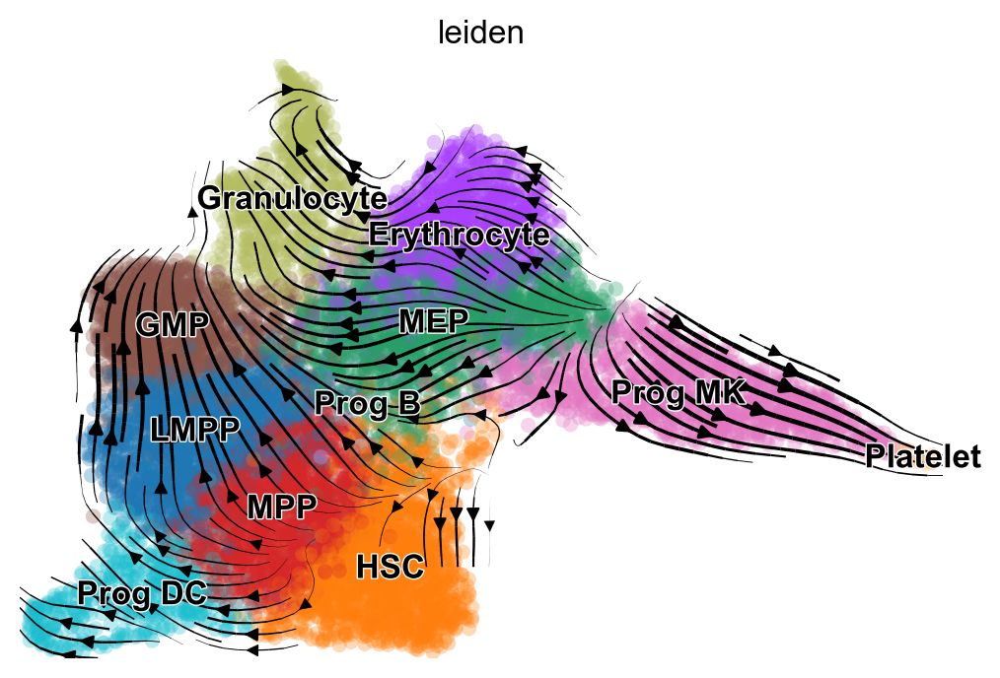

In [11]:
mv.velocity_embedding_stream(adata_result, basis='umap', color='leiden', show=True)

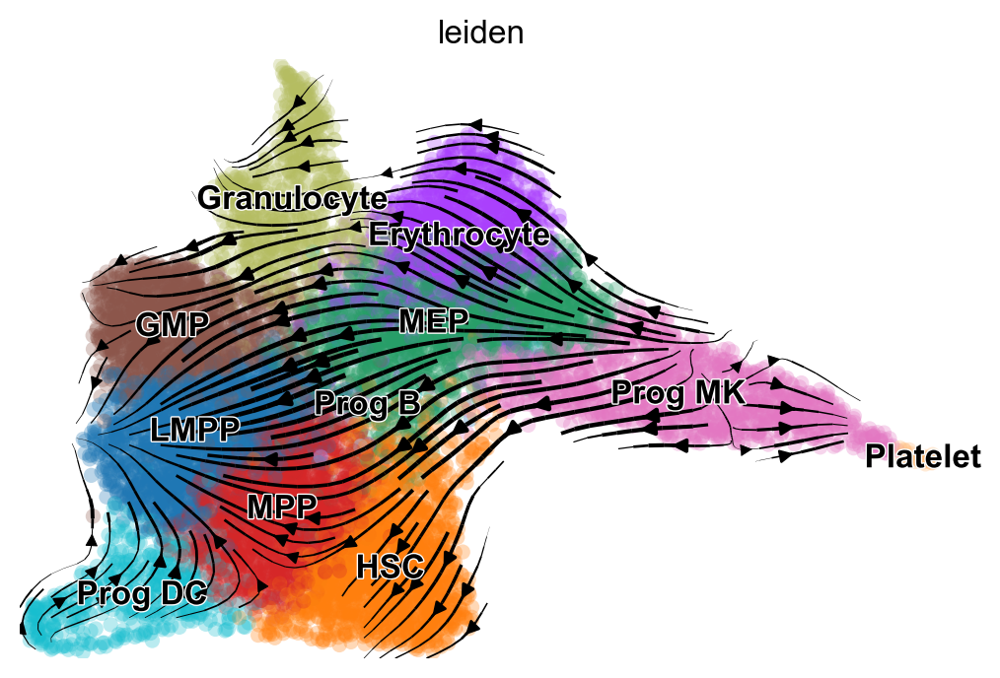

In [12]:
scv.pl.velocity_embedding_stream(adata_result, basis='umap', color='leiden')

## Fig 5b

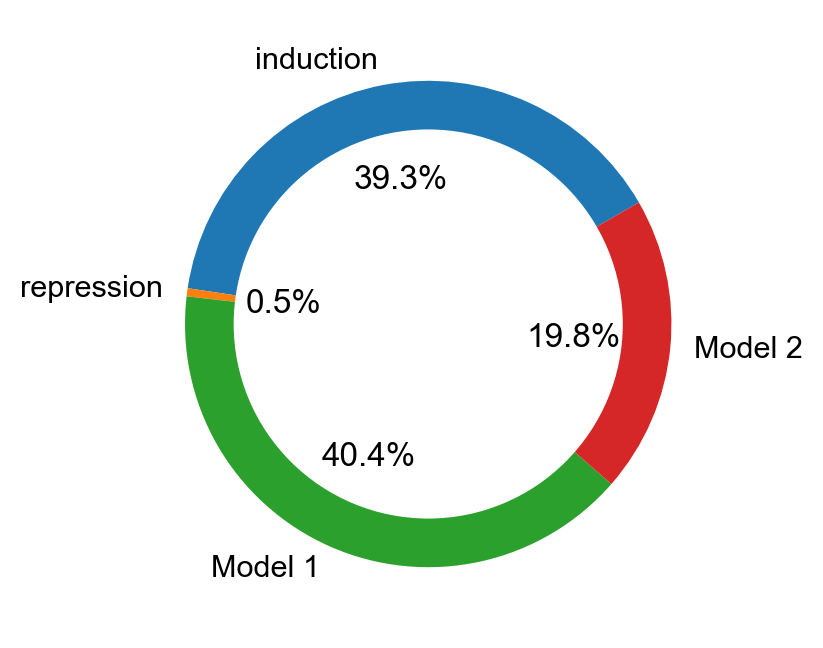

In [13]:
mv.pie_summary(adata_result)

## Fig 5c

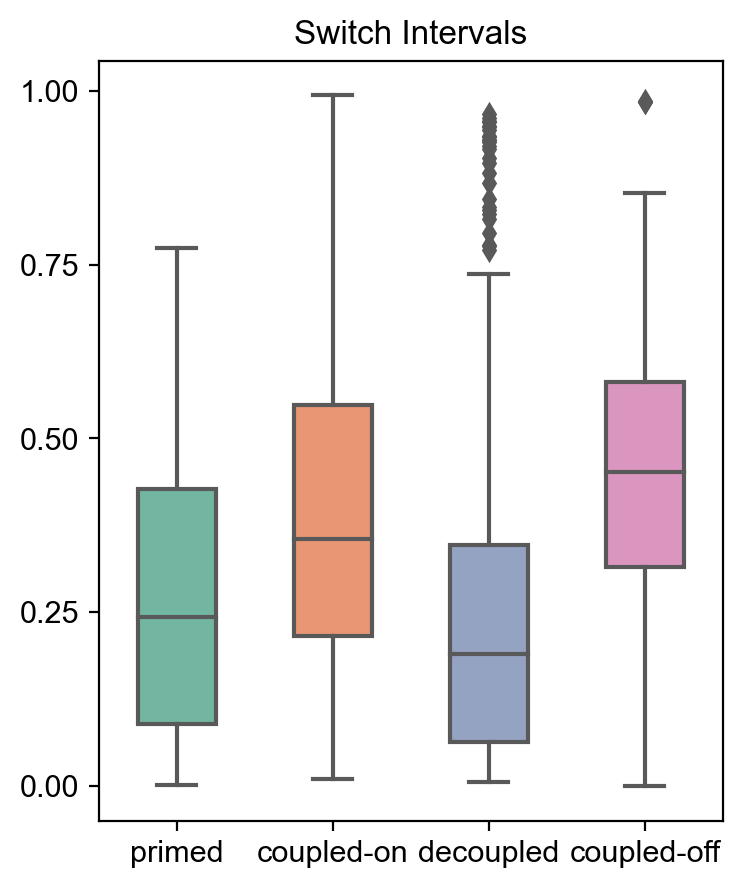

In [14]:
mv.switch_time_summary(adata_result)

## Fig 5d

In [15]:
# variables for subsetting the AnnData object to just the myeloid lineage
hsc_check = adata_result.obs['leiden'] == "HSC"
mpp_check = adata_result.obs['leiden'] == "MPP"
lmpp_check = adata_result.obs['leiden'] == "LMPP"
gmp_check = adata_result.obs['leiden'] == "GMP"

myeloid_check = (hsc_check | mpp_check | lmpp_check | gmp_check)


# variables for subsetting the AnnData object to just the erythrocyte lineage
erythrocyte_check = adata_result.obs['leiden'] == "Erythrocyte"
mep_check = adata_result.obs['leiden'] == "MEP"
hsc_check = adata_result.obs['leiden'] == "HSC"
progdc_check = adata_result.obs['leiden'] == "ProgDC"

erythroid_check = (erythrocyte_check | mep_check | hsc_check | progdc_check)


# variables for subsetting the AnnData object to just the platelet lineage
platelet_check = adata_result.obs['leiden'] == "Platelet"
progmk_check = adata_result.obs['leiden'] == "Prog MK"
mep_check = adata_result.obs['leiden'] == "MEP"

platelet_lineage_check = (platelet_check | progmk_check | mep_check | hsc_check)

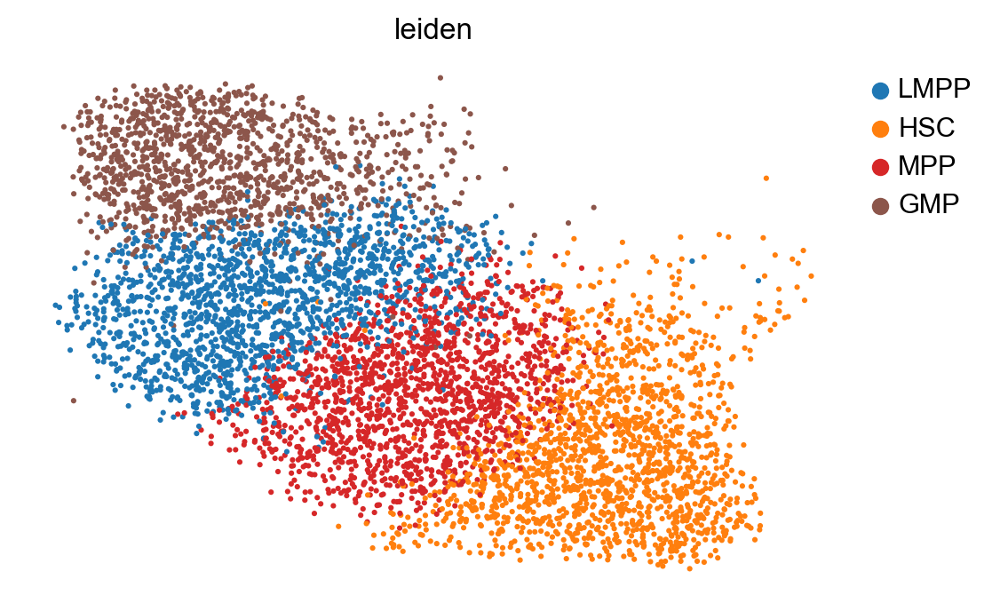

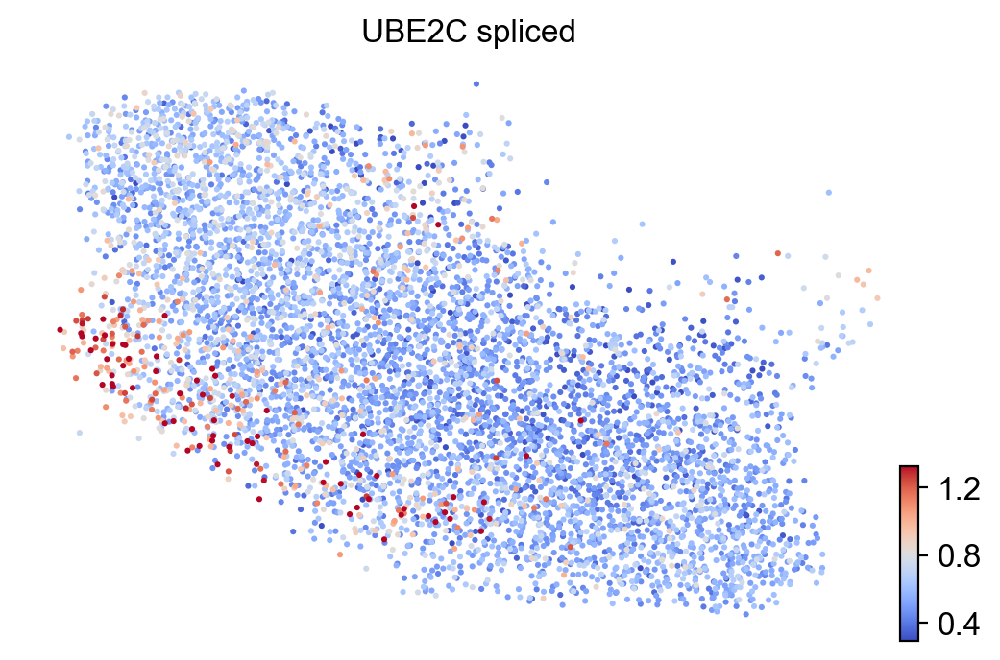

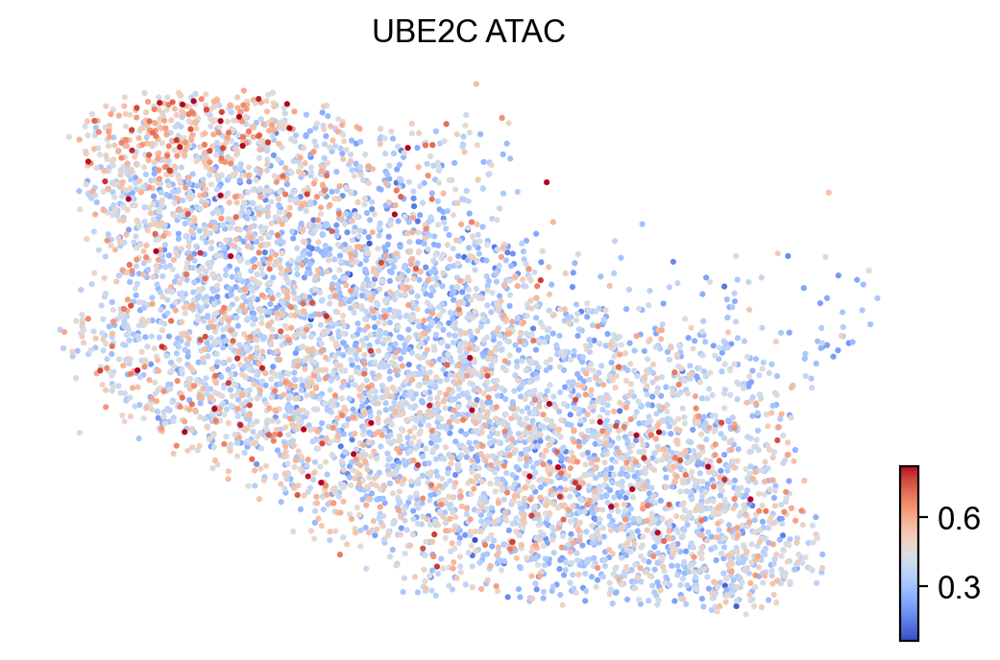

In [16]:
myeloid_data = adata_result[myeloid_check, :]

scv.pl.umap(myeloid_data, color='leiden')
scv.pl.umap(myeloid_data, color='UBE2C', layer='Ms', title='UBE2C spliced', cmap="coolwarm")
scv.pl.umap(myeloid_data, color='UBE2C', layer='ATAC', title='UBE2C ATAC', perc=[0,99.5], cmap="coolwarm")

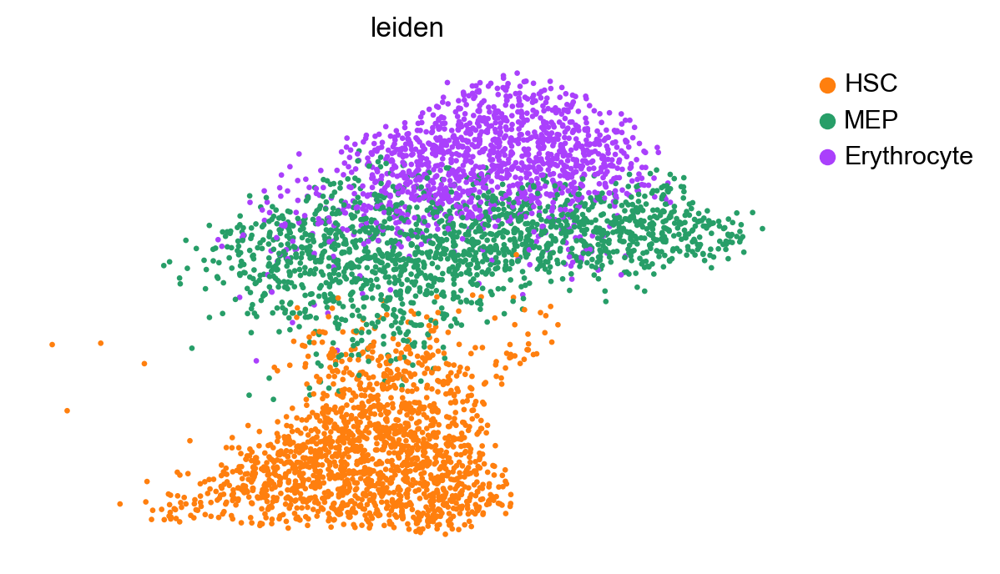

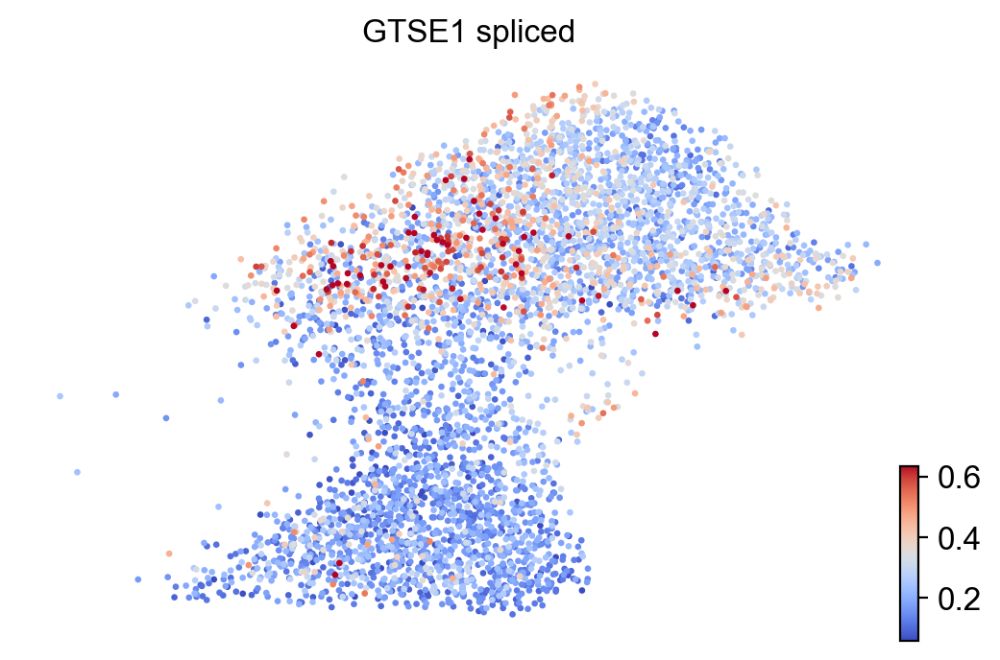

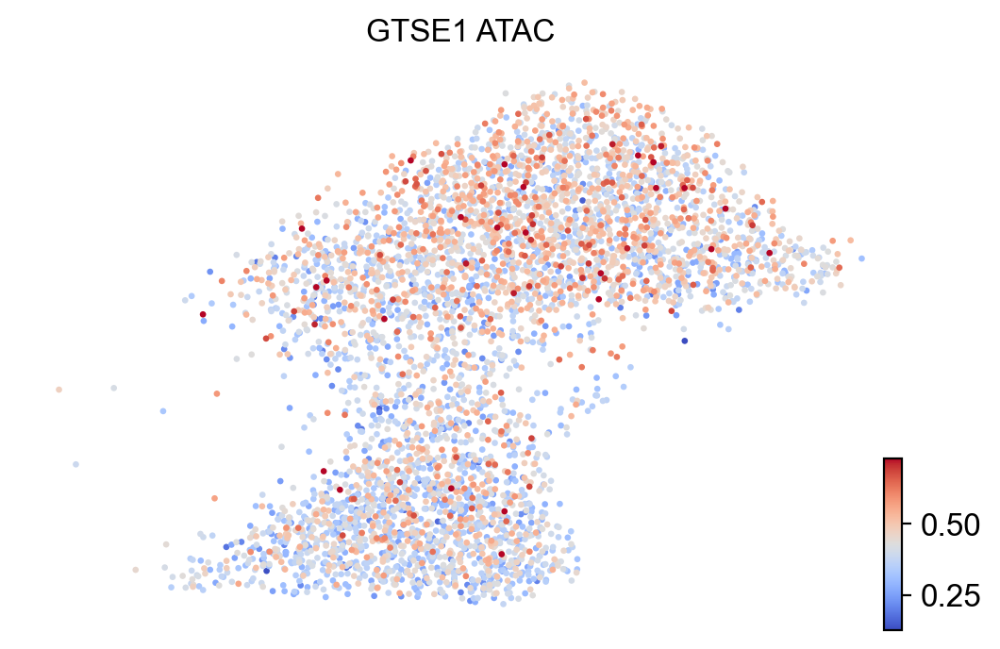

In [17]:
erythroid_data = adata_result[erythroid_check, :]

scv.pl.umap(erythroid_data, color='leiden')
scv.pl.umap(erythroid_data, color='GTSE1', layer='Ms', title='GTSE1 spliced', cmap="coolwarm")
scv.pl.umap(erythroid_data, color='GTSE1', layer='ATAC', title='GTSE1 ATAC', perc=[0,99.5], cmap="coolwarm")

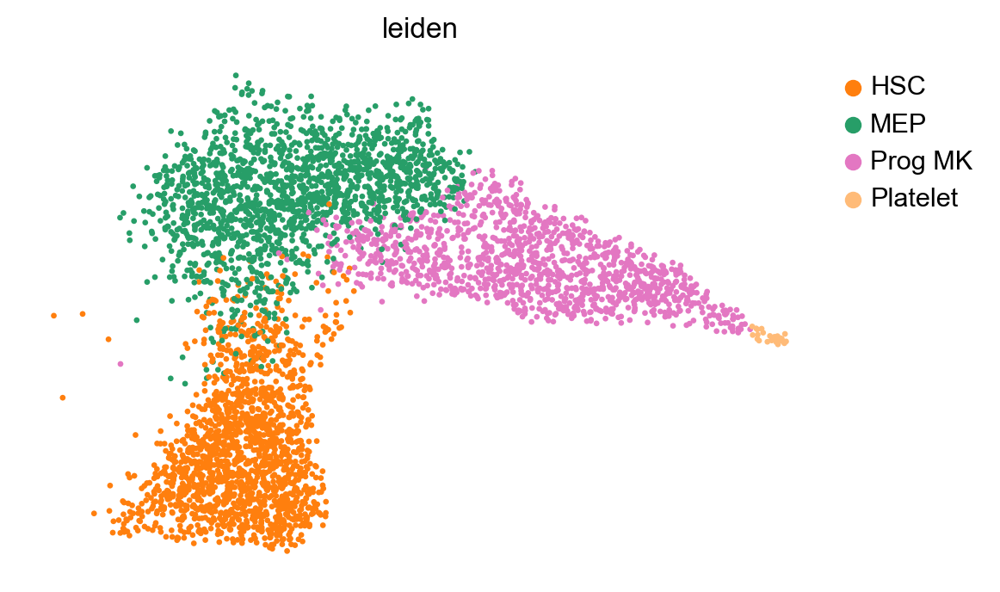

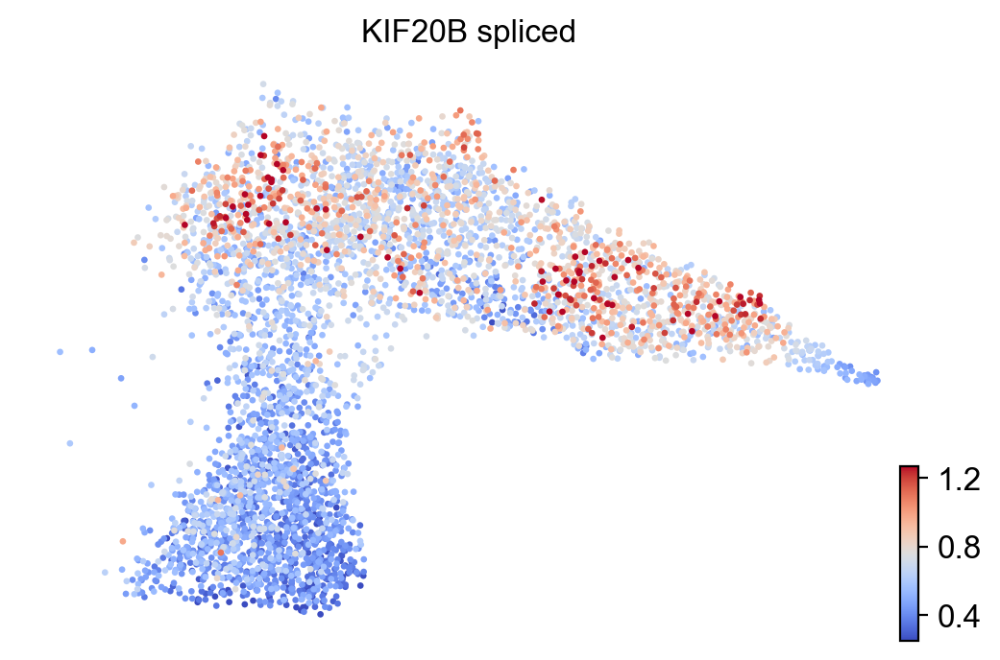

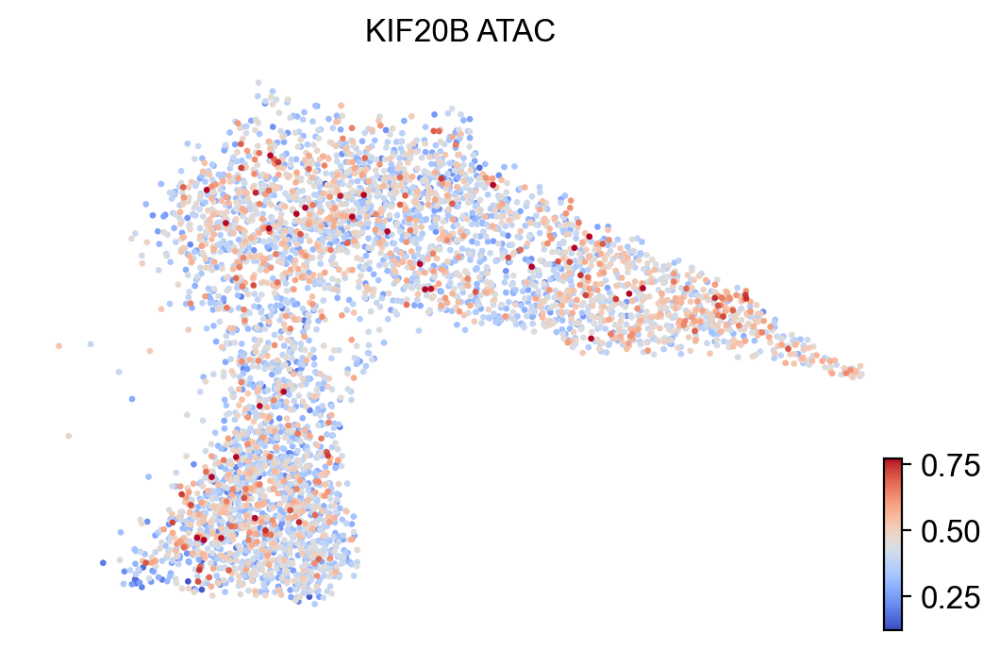

In [18]:
platelet_data = adata_result[platelet_lineage_check, :]

scv.pl.umap(platelet_data, color='leiden')
scv.pl.umap(platelet_data, color='KIF20B', layer='Ms', title='KIF20B spliced', cmap="coolwarm")
scv.pl.umap(platelet_data, color='KIF20B', layer='ATAC', title='KIF20B ATAC', perc=[0,99.5], cmap="coolwarm")

## Fig 5e

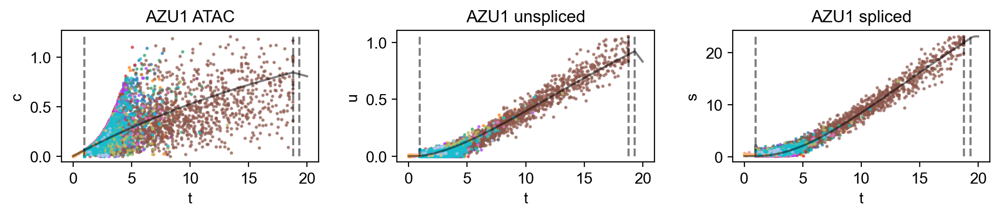

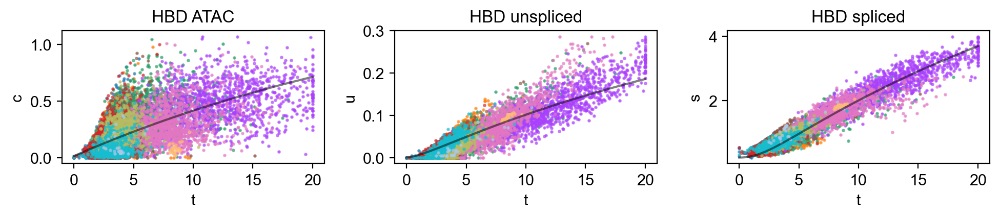

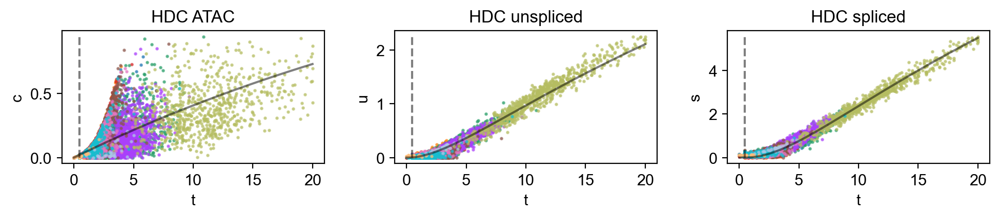

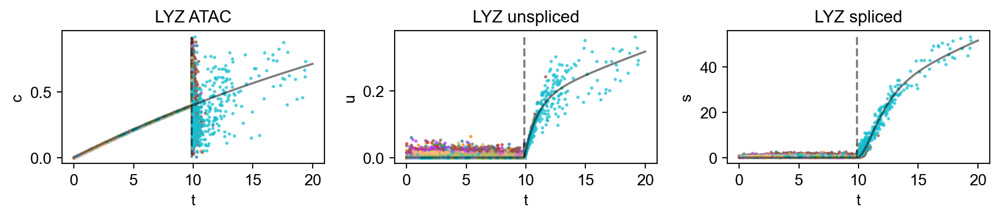

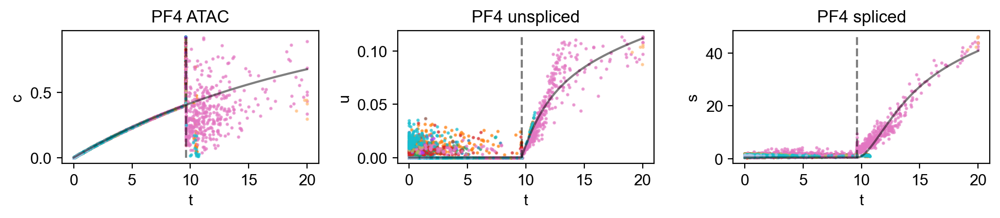

In [19]:
genes = ["AZU1", "HBD", "HDC", "LYZ", "PF4"]

for gene in genes:
    mv.dynamic_plot(adata_result, genes=gene, color_by="leiden", cmap="tab20")

## Fig 5f

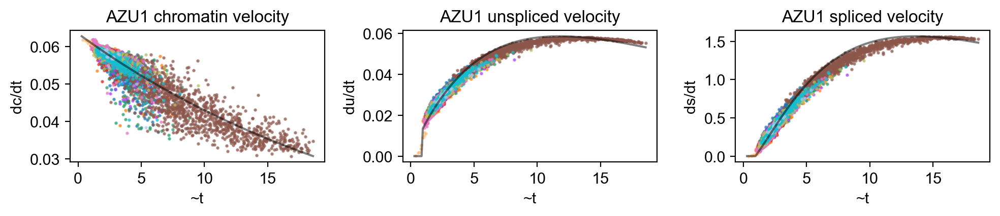

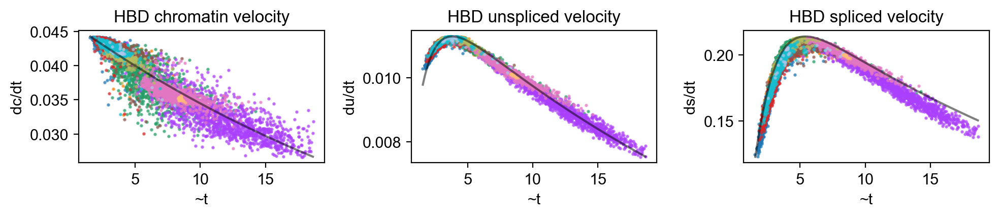

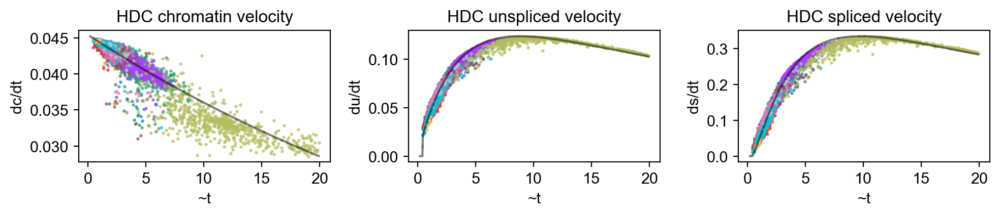

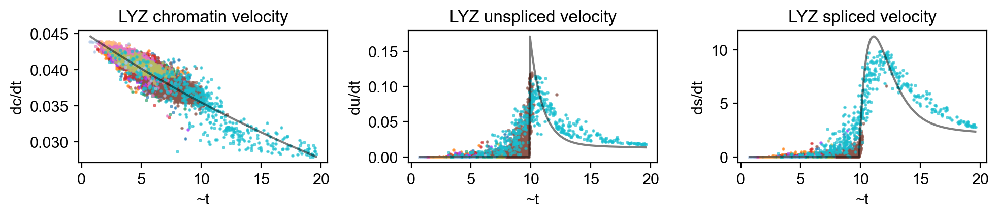

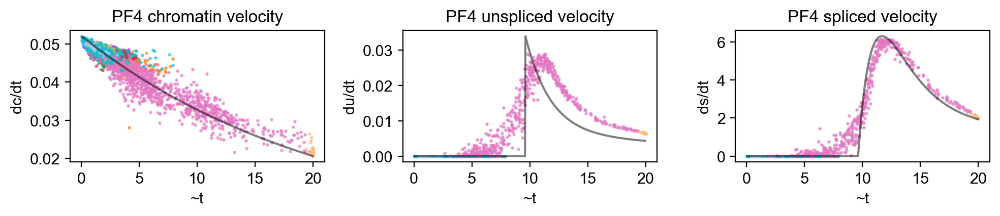

In [20]:
genes = ["AZU1", "HBD", "HDC", "LYZ", "PF4"]

for gene in genes:
    mv.dynamic_plot(adata_result, by="velocity", genes=gene, color_by="leiden", cmap="tab20")

## Fig 5g

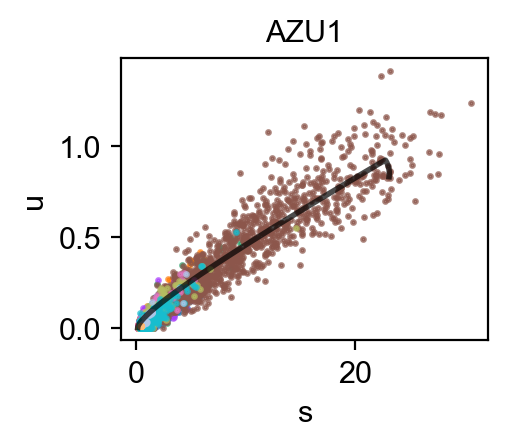

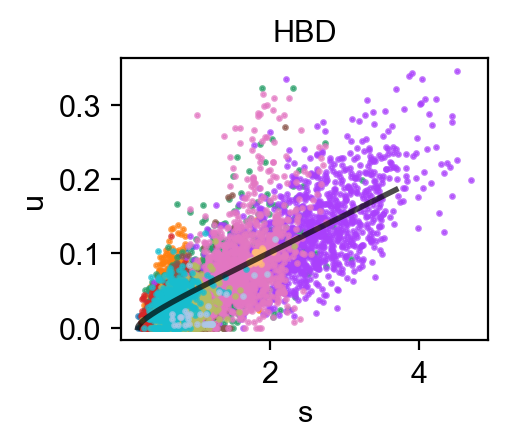

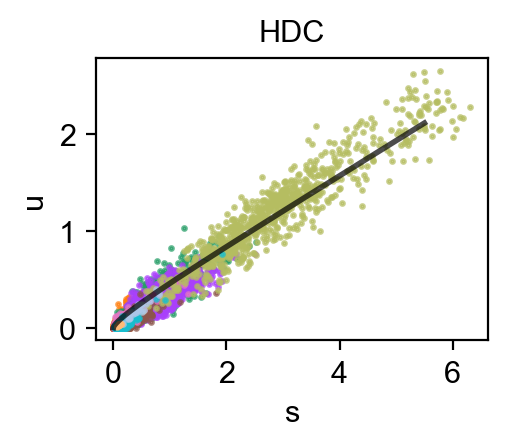

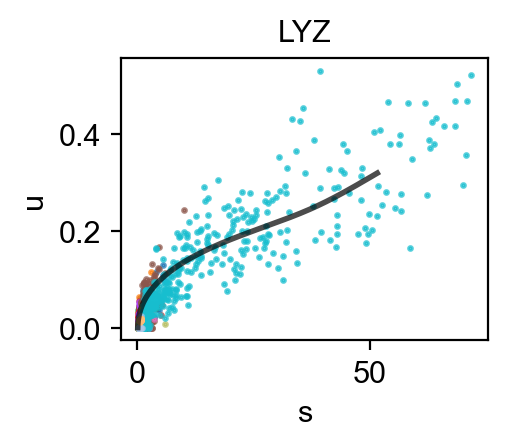

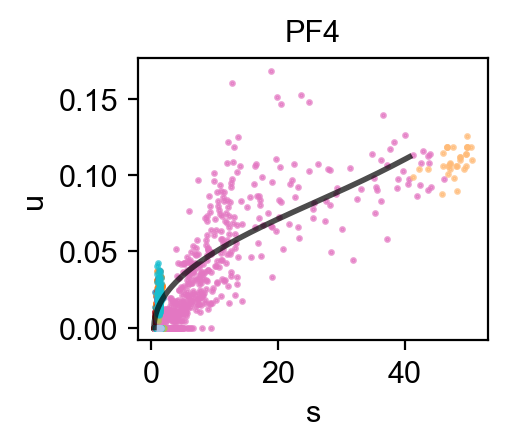

In [21]:
genes = ["AZU1", "HBD", "HDC", "LYZ", "PF4"]

for gene in genes:
    mv.scatter_plot(adata_result, genes=gene, color_by="leiden", cmap="tab20", show_switches=False)